# Midterm Outputs

## Import and prep data

In [2]:
#import libraries
import pandas as pd
import geopandas as gpd
import fiona
import geopandas.geoseries  
import folium
import plotly.express as px
import numpy as np
import seaborn as sns

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


In [3]:
#import jobs/housing data and race data
df1=pd.read_csv('jobshousing.csv')
df2=pd.read_csv('racetracts.csv')
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 14 columns):
 #   Column                                                   Non-Null Count  Dtype 
---  ------                                                   --------------  ----- 
 0   Unnamed: 0                                               2495 non-null   int64 
 1   CT20                                                     2495 non-null   int64 
 2   geometry                                                 2495 non-null   object
 3   FIPS                                                     2495 non-null   int64 
 4   TotalPop                                                 2495 non-null   int64 
 5   Non Hispanic                                             2495 non-null   int64 
 6   Non Hispanic White Alone                                 2495 non-null   int64 
 7   Non Hispanic Black Alone                                 2495 non-null   int64 
 8   Non Hispanic American Indian and Alask

In [4]:
#Import neighborhood shapes
nhoods=gpd.read_file('data/L.A. Neighborhoods.geojson')
nhoods.head()
nhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [5]:
#join race with nh shapes 
from shapely import wkt
df2['geometry'] = df2['geometry'].apply(wkt.loads)
gdf2 = gpd.GeoDataFrame(df2, crs="EPSG:4326",geometry='geometry')
nhjoin=gdf2.overlay(nhoods, how='intersection')
nhjoin.set_index('name')
nhjoin.drop(nhjoin[nhjoin['type'] != 'segment-of-a-city'].index, inplace = True)

In [6]:
df1['geometry'] = df1['geometry'].apply(wkt.loads)
jh=gpd.GeoDataFrame(df1, crs="EPSG:4326",geometry='geometry')


In [7]:
#overlay to cut tracts not in the city of LA
zipfile = "data/City_Boundary.zip"
city = geopandas.read_file(zipfile)
racegdf = nhjoin.overlay(city, how='intersection')
racegdf.drop(racegdf[racegdf['type'] != 'segment-of-a-city'].index, inplace = True)
racegdf.sample(25)


,Unnamed: 0,CT20,FIPS,TotalPop,Non Hispanic,Non Hispanic White Alone,Non Hispanic Black Alone,Non Hispanic American Indian and Alaska Native Alone,Non Hispanic Asian Alone,Non Hispanic Native Hawaiian and Pacific Islander Alone,...,description,set,slug,square_miles,region,type,source_link,OBJECTID,CITY,geometry
574,376,143200,6037143200,4377,3467,2490,283,17,386,5,...,Studio City is a neighborhood in the city of L...,L.A. County Neighborhoods (Current),studio-city,6.30792524254,San Fernando Valley,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"POLYGON ((-118.37564 34.15296, -118.37555 34.1..."
91,36,104704,6037104704,4760,1002,281,407,2,239,3,...,Hansen Dam is a neighborhood in the city of Lo...,L.A. County Neighborhoods (Current),hansen-dam,1.96106923644,San Fernando Valley,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"POLYGON ((-118.39897 34.26186, -118.40181 34.2..."
891,416,185203,6037185203,2651,687,381,21,10,209,2,...,Mount Washington is a neighborhood in the city...,L.A. County Neighborhoods (Current),mount-washington,1.85040389289,Northeast L.A.,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"POLYGON ((-118.23146 34.10481, -118.22925 34.1..."
1809,1779,540901,6037540901,5324,1472,95,1238,3,38,24,...,Green Meadows is a neighborhood in the city of...,L.A. County Neighborhoods (Current),green-meadows,2.21985249315,South L.A.,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"POLYGON ((-118.26944 33.92311, -118.26828 33.9..."
1613,812,231902,6037231902,3166,596,58,456,5,14,1,...,Historic South-Central is a neighborhood in th...,L.A. County Neighborhoods (Current),historic-south-central,2.55351898402,South L.A.,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"POLYGON ((-118.28053 34.00378, -118.28050 34.0..."
774,372,141600,6037141600,4088,3805,3211,50,0,304,2,...,Beverly Crest is a neighborhood in the city of...,L.A. County Neighborhoods (Current),beverly-crest,8.23609299869,Westside,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"MULTIPOLYGON (((-118.45619 34.13236, -118.4562..."
318,240,127520,6037127520,4226,1037,364,251,10,320,2,...,Panorama City is a neighborhood in the city of...,L.A. County Neighborhoods (Current),panorama-city,3.64799571506,San Fernando Valley,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"MULTIPOLYGON (((-118.46618 34.21511, -118.4661..."
1178,629,209202,6037209202,1234,421,100,87,6,192,0,...,Westlake is a neighborhood in the city of Los ...,L.A. County Neighborhoods (Current),westlake,2.71730553526,Central L.A.,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"POLYGON ((-118.26079 34.05343, -118.26088 34.0..."
2034,1018,274202,6037274202,4903,4444,3604,197,2,320,0,...,Playa del Rey is a neighborhood in the city of...,L.A. County Neighborhoods (Current),playa-del-rey,2.75429310607,South Bay,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"MULTIPOLYGON (((-118.45187 33.96456, -118.4519..."
333,122,115301,6037115301,4236,3100,1764,222,2,880,13,...,Northridge is a neighborhood in the city of Lo...,L.A. County Neighborhoods (Current),northridge,9.46748743941,San Fernando Valley,segment-of-a-city,http://maps.latimes.com/neighborhoods/neighbor...,1,IN,"POLYGON ((-118.54408 34.25001, -118.54346 34.2..."


In [8]:
#approximate average for race in neighborhoods 
nhrace= nhjoin.dissolve(by='name', aggfunc='sum')
nhrace.head()

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1676: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_data = data.groupby(**groupby_kwargs).agg(aggfunc)


,geometry,Unnamed: 0,CT20,FIPS,TotalPop,Non Hispanic,Non Hispanic White Alone,Non Hispanic Black Alone,Non Hispanic American Indian and Alaska Native Alone,Non Hispanic Asian Alone,Non Hispanic Native Hawaiian and Pacific Islander Alone,Non Hispanic Other Alone,Non Hispanic Multi Race,Hispanic
name,,,,,,,,,,,,,,
Adams-Normandie,"POLYGON ((-118.30541 34.02571, -118.30890 34.0...",8267,2439227,66409439227,36861,15352,3804,5859,60,4337,34,245,1013,21509
Arleta,"POLYGON ((-118.43579 34.22987, -118.43582 34.2...",2064,1667245,84519667245,56835,17156,8872,757,91,6513,44,202,677,39679
Arlington Heights,"POLYGON ((-118.33381 34.03501, -118.33271 34.0...",9227,2820162,78483820162,43166,21826,4339,5989,69,9858,21,300,1250,21340
Atwater Village,"POLYGON ((-118.27051 34.12151, -118.27331 34.1...",11440,3729825,72447729825,48540,32363,22006,1051,92,7536,43,184,1451,16177
Baldwin Hills/Crenshaw,"POLYGON ((-118.36504 34.00556, -118.36623 34.0...",24408,7467665,126784467665,73917,51807,9726,33070,117,4061,94,734,4005,22110


In [9]:
#create race percentages
racelist=['Non Hispanic White Alone','Non Hispanic Black Alone', 'Non Hispanic American Indian and Alaska Native Alone', 'Non Hispanic Asian Alone', 'Non Hispanic Native Hawaiian and Pacific Islander Alone', 'Non Hispanic Other Alone', 'Non Hispanic Multi Race', 'Hispanic']
for race in racelist:
    nhrace['Percent'+' '+race]=((nhrace[race]/nhrace['TotalPop'])*100)
    
nhrace.info(10)

   

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 114 entries, Adams-Normandie to Woodland Hills
Data columns (total 22 columns):
 #   Column                                                           Non-Null Count  Dtype   
---  ------                                                           --------------  -----   
 0   geometry                                                         114 non-null    geometry
 1   Unnamed: 0                                                       114 non-null    int64   
 2   CT20                                                             114 non-null    int64   
 3   FIPS                                                             114 non-null    int64   
 4   TotalPop                                                         114 non-null    int64   
 5   Non Hispanic                                                     114 non-null    int64   
 6   Non Hispanic White Alone                                         114 non-null    int64   
 7   Non His

In [10]:
#change name to neighborhood
idx=nhrace.index
idx.rename('Neighborhood',inplace=True)
nhrace.sample(25)


,geometry,Unnamed: 0,CT20,FIPS,TotalPop,Non Hispanic,Non Hispanic White Alone,Non Hispanic Black Alone,Non Hispanic American Indian and Alaska Native Alone,Non Hispanic Asian Alone,...,Non Hispanic Multi Race,Hispanic,Percent Non Hispanic White Alone,Percent Non Hispanic Black Alone,Percent Non Hispanic American Indian and Alaska Native Alone,Percent Non Hispanic Asian Alone,Percent Non Hispanic Native Hawaiian and Pacific Islander Alone,Percent Non Hispanic Other Alone,Percent Non Hispanic Multi Race,Percent Hispanic
Neighborhood,,,,,,,,,,,,,,,,,,,,,
Westchester,"POLYGON ((-118.40221 33.93149, -118.42318 33.9...",51107,15006400,193199006400,125840,87045,42365,22489,231,13377,...,7201,38795,33.665766,17.871106,0.183566,10.630165,0.293229,0.804990,5.722346,30.828830
Hyde Park,"POLYGON ((-118.33302 33.97270, -118.33304 33.9...",23131,6632339,120746632339,80572,46620,3344,37884,152,1138,...,3319,33952,4.150325,47.018815,0.188651,1.412401,0.090602,0.881199,4.119297,42.138708
Arleta,"POLYGON ((-118.43579 34.22987, -118.43582 34.2...",2064,1667245,84519667245,56835,17156,8872,757,91,6513,...,677,39679,15.610099,1.331926,0.160113,11.459488,0.077417,0.355415,1.191167,69.814375
Sawtelle,"POLYGON ((-118.46773 34.03864, -118.47088 34.0...",26368,7752076,138858752076,78698,64116,40286,3077,105,15501,...,4499,14582,51.190627,3.909883,0.133421,19.696816,0.146128,0.677273,5.716791,18.529060
Montecito Heights,"POLYGON ((-118.21201 34.07926, -118.21201 34.0...",8961,3293448,84521293448,49843,21689,8909,1292,130,9540,...,1533,28154,17.874125,2.592139,0.260819,19.140100,0.034107,0.537688,3.075658,56.485364
University Park,"POLYGON ((-118.27974 34.01847, -118.28282 34.0...",9129,2678395,72446678395,37523,20107,7533,3344,104,7980,...,859,17416,20.075687,8.911867,0.277163,21.266956,0.213203,0.551662,2.289263,46.414199
Valley Village,"POLYGON ((-118.41381 34.15668, -118.41391 34.1...",2928,1534014,72445534014,45321,35476,27256,2546,95,2878,...,2281,9845,60.139891,5.617705,0.209616,6.350257,0.103705,0.823018,5.032987,21.722822
Echo Park,"POLYGON ((-118.25951 34.06191, -118.25991 34.0...",11590,4359083,108670359083,58144,31392,17019,2243,112,9556,...,2052,26752,29.270432,3.857664,0.192625,16.435058,0.056756,0.648390,3.529169,46.009906
East Hollywood,"POLYGON ((-118.30937 34.09077, -118.30940 34.0...",12687,5002364,156967002364,87487,43022,22366,3341,151,14139,...,2374,44465,25.564941,3.818853,0.172597,16.161258,0.094871,0.649239,2.713546,50.824694


## Static Maps 

In [11]:
raceper=['Percent'+' '+ s for s in racelist]
print(raceper)



['Percent Non Hispanic White Alone', 'Percent Non Hispanic Black Alone', 'Percent Non Hispanic American Indian and Alaska Native Alone', 'Percent Non Hispanic Asian Alone', 'Percent Non Hispanic Native Hawaiian and Pacific Islander Alone', 'Percent Non Hispanic Other Alone', 'Percent Non Hispanic Multi Race', 'Percent Hispanic']


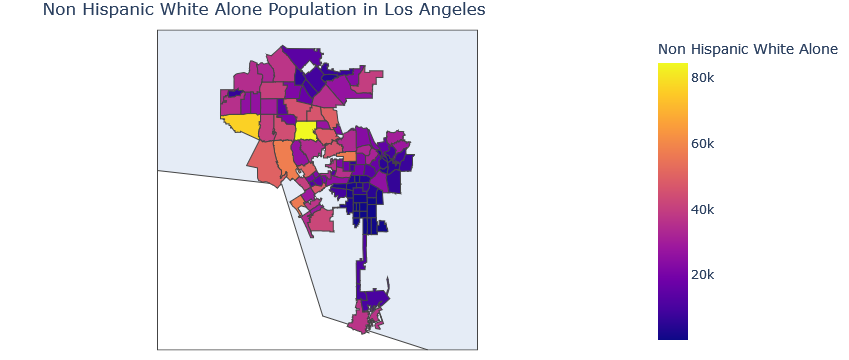

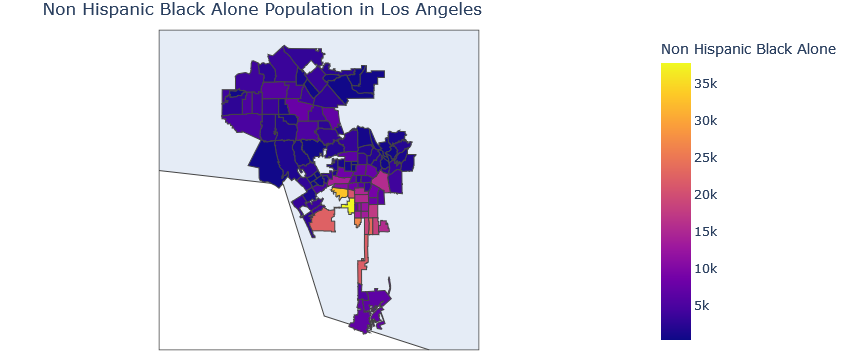

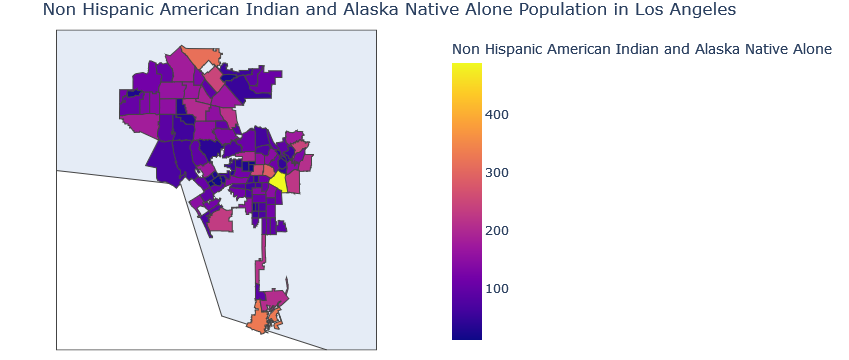

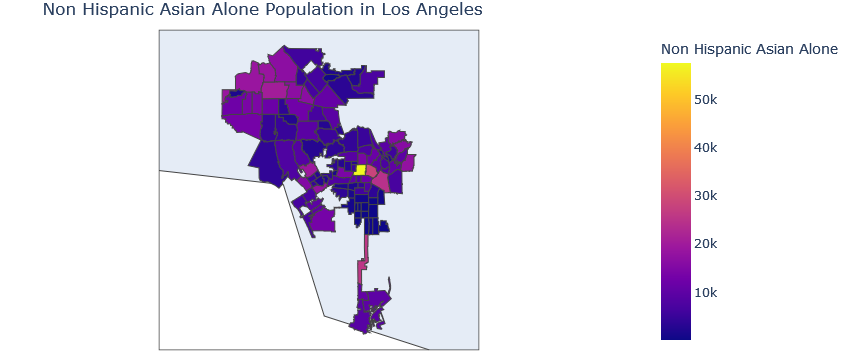

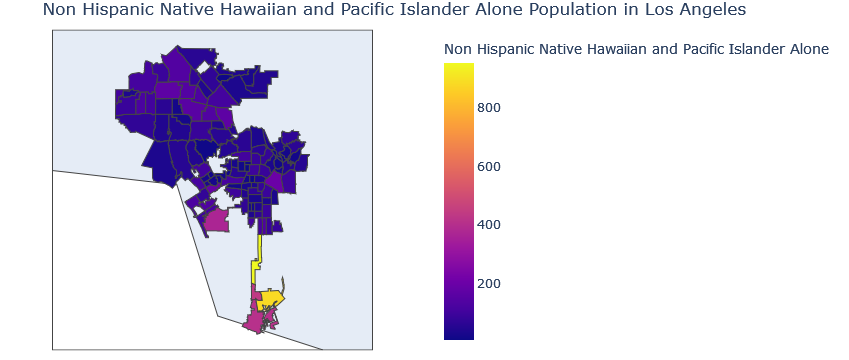

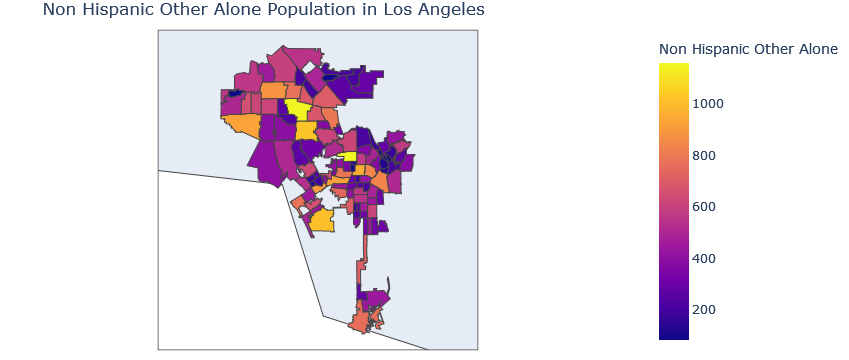

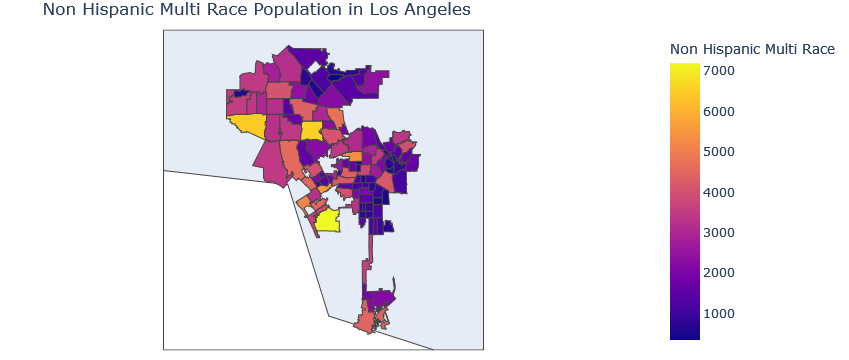

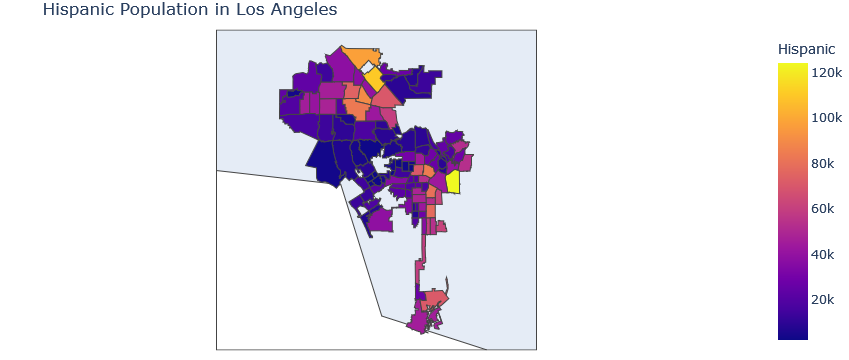

In [18]:
for r in racelist:
    fig = px.choropleth(nhrace,
                   geojson=nhrace.geometry,
                   locations=nhrace.index,
                   color=r,
                   projection="mercator",title=r+' '+'Population in Los Angeles',)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(height=300, margin={"r":0,"t":30,"l":0,"b":10})
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show()




## Interactive Maps

In [15]:
#Map of Jobs housing Ratio with housing and jobs layers
m = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

#Quantile layer
folium.Choropleth(
    geo_data=jh,
    name="Number of Jobs Per Unit of Housing",
    data=jh,
    columns=["Neighborhood","Jobs to Housing Quantiles"],
    key_on="feature.properties.Neighborhood",
    fill_color="BuPu",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Jobs to Housing Quantiles",
).add_to(m)
    
#Jobs layer
folium.Choropleth(
    geo_data=jh,
    name="Jobs Per Neighborhood",
    data=jh,
    columns=["Neighborhood","Number of Jobs"],
    key_on="feature.properties.Neighborhood",
    fill_color="PuBuGn",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Jobs Per Neighborhood",
    show=False,

).add_to(m)
    
#Housing layer
folium.Choropleth(
    geo_data=jh,
    name="Housing Units Per Neighborhood",
    data=jh,
    columns=["Neighborhood","Units of Housing"],
    key_on="feature.properties.Neighborhood",
    fill_color="OrRd",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Housing Units Per Neighborhood",
    show=False,

).add_to(m)

folium.LayerControl().add_to(m)

m

In [16]:
m.save("JobsHousingMap.html")

In [17]:
#Interactive Race Map
#reanme index in a copy 
nhracemap=nhrace.copy()
nhracemap['nh']=nhrace.index

#loop to plug race into layers
m2 = folium.Map(location=[34.0522, -118.2437], zoom_start=10)
for race in racelist:
    folium.Choropleth(
        geo_data=nhracemap,
        name="Population By Race-"+race,
        data=nhracemap,
        columns=[nhrace.index,race],
        key_on="feature.properties.nh",
        fill_color="PuBuGn",
        fill_opacity=0.9,
        line_opacity=0.2,
        legend_name="Population-"+race,
        show=False
    ).add_to(m2)

    
folium.LayerControl().add_to(m2)
m2

In [18]:
m2.save("Racemap.html")

### Graphing Race in Low-Housing, Job Rich Neighborhoods 

In [19]:
#Join race data with jobs/housing data
jh['Merge']=jh['Neighborhood']
nhrace['Merge']=nhrace.index
mergedstats=jh.merge(nhrace, on='Merge')
mergedstats.set_index('Neighborhood')
mergedstats.head()

,Unnamed: 0_x,OBJECTID,CITY,Neighborhood,year_x,Units of Housing,year_y,Number of Jobs,description,set,...,Non Hispanic Multi Race,Hispanic,Percent Non Hispanic White Alone,Percent Non Hispanic Black Alone,Percent Non Hispanic American Indian and Alaska Native Alone,Percent Non Hispanic Asian Alone,Percent Non Hispanic Native Hawaiian and Pacific Islander Alone,Percent Non Hispanic Other Alone,Percent Non Hispanic Multi Race,Percent Hispanic
0,0,1,IN,Pico-Union,2019,13618.70,2019,10516.11,Pico-Union is a neighborhood in the city of Lo...,L.A. County Neighborhoods (Current),...,1040,53440,5.610262,5.060680,0.149039,16.069623,0.055890,0.557566,1.383936,71.113004
1,1,1,IN,Sylmar,2019,22156.30,2019,20444.10,Sylmar is a neighborhood in the city of Los An...,L.A. County Neighborhoods (Current),...,1495,97686,11.473219,2.563106,0.255987,4.875085,0.046175,0.441496,1.211075,79.133858
2,4,1,IN,North Hills,2019,17637.30,2019,9615.66,North Hills is a neighborhood in the city of L...,L.A. County Neighborhoods (Current),...,2389,74826,18.006146,3.862333,0.138028,13.802849,0.117489,0.633452,1.962798,61.476905
3,5,1,IN,Harbor Gateway,2019,13329.57,2019,31028.04,Harbor Gateway is a neighborhood in the city o...,L.A. County Neighborhoods (Current),...,3613,59327,9.379329,17.785689,0.171558,20.631303,0.769194,0.568639,2.910049,47.784239
4,7,1,IN,Lake Balboa,2019,9621.27,2019,10142.76,Lake Balboa is a neighborhood in the city of L...,L.A. County Neighborhoods (Current),...,1379,19212,33.892752,4.014306,0.087539,9.794407,0.050023,0.660297,3.449052,48.051623


In [20]:
#Sort top ten neighborhoods for low housing and plot by race 
sorted2=mergedstats.sort_values(by='Number of Jobs Per Unit of Housing', ascending=False,)
sorted2.drop(columns={'Unnamed: 0_x','OBJECTID', 'CITY','year_x','Percent Non Hispanic'},inplace=True)
sorted2.info(10)


KeyError: "['Percent Non Hispanic'] not found in axis"

In [ ]:
#convert columns to int
for r in raceper:
    mergedstats = mergedstats.astype({r:'int'})
    
sorted2.head(10)

In [ ]:
#dropping non hispanic category to reflect accurate percentages 
raceper2=['Percent Non Hispanic White Alone',
 'Percent Non Hispanic Black Alone',
 'Percent Non Hispanic American Indian and Alaska Native Alone',
 'Percent Non Hispanic Asian Alone',
 'Percent Non Hispanic Native Hawaiian and Pacific Islander Alone',
 'Percent Non Hispanic Other Alone',
 'Percent Non Hispanic Multi Race',
 'Percent Hispanic']

In [ ]:
 #Stacked plot   
    fig = px.bar(sorted2.head(10),
       x='Neighborhood',
             y=raceper2,
                labels={'Demographic Percentages'})
    #adding titles
    fig.update_layout(
        title='Demographic Breakdown of High Job, Low Housing Neighborhoods',
        yaxis=dict(
            title='Population Percent'))

fig.show()

In [ ]:
fig.write_html("Racebarchart.html")